# Density Estimation with Partial Differential Equation Regularization
Ilenia Di Battista, Alessandro Palummo @ fdaPDE Team, MOX, Department of Mathematics, Politecnico di Milano, Italy

`fdaPDE` (Palummo et al., 2025) is a C++ library with an interface to R and Python for *physics-informed spatial and functional data analysis*, at the intersection of statistics and numerical analysis. The library provides advanced statistical methods designed for data located over complex spatial domains, ranging from irregular planar regions and curved surfaces to linear networks and volumes, possibly evolving over time. The class of methods implemented in `fdaPDE` features regularization terms based on Partial Differential Equations (PDEs), which allow incorporating information derived from the physics of the problem under study into the statistical modeling. This makes `fdaPDE` an extremely flexible tool for the analysis of complex data. For a review of this class of methods, refer to  Sangalli (2021).

This notebook describes the `fdaPDE` Python interface for **spatial density estimation**.

## Model

Given *independent and identically distributed* point locations $\left\{\mathbf{p}_i\right\}_{i=1}^n \in \mathcal{D}$ observed on a *spatial domain* $\mathcal{D} \subset \mathbb{R}^2$, drawn from a common distribution $F$, we aim to estimate the corresponding *unknown probability density function* $f : \mathcal{D} \to \mathbb{R}^+$. Here, the spatial domain is a *planar region*, which may feature non-standard geometries, including irregular boundaries, concavities, and holes. The proposed density estimation method can accommodate also data observed on other types of spatial domains; examples include *linear networks* and *curved surfaces*.

For mathematical convenience, the estimation problem is reparameterized in terms of the log-density $g = \log f$. Ferraccioli et al. (2021)  proposes to estimate $g$ as the minimizer of the following **penalized negative log-likelihood** $L(g)$:
$$ L(g) = -\frac{1}{n} \sum_{i=1}^n g(\mathbf{p}_i)+\int_\mathcal{D} e^{g(\mathbf{p})} \, \text{d} \mathbf{p} + \lambda \int_\mathcal{D} \left( \Delta g(\mathbf{p}) \right)^2 \, \text{d}\mathbf{p}\,. $$


The first term represents the *model fit* criterion. The second term ensures that $f$ is a *proper density* in $\mathcal{D}$. The third term is the **regularization term**, which encodes the *smoothness of the estimate*. The **smoothing parameter** $\lambda > 0$ balances the model adherence to the data with the regularity of the estimate. Extensions of this model to accommodate data observed on curved surfaces are described in Arnone et al. (2022), while Begu et al. (2024) proposes the model for density estimation in the spatio-temporal framework.

In this notebook we describe how the `fdaPDE` library gives easy access to the described physics-informed Density Estimation model , hereafter referred to as `DE-PDE`.

In [ ]:
## Google-colab setup cell, you can skip this cell if you are running the notebook locally
import sys

if "google.colab" in sys.modules:
  # clone data and utilites
  !git clone https://github.com/fdaPDE/course-materials.git
  %cd course-materials/courses/[2026-Rome]-Advanced-Topics-in-Statistical-Machine-Learning/notebook

  # install dependencies
  !pip install numpy matplotlib pandas geopandas folium branca rasterio rioxarray seaborn IPython
  !pip install -i https://test.pypi.org/simple/ fdaPDE

We start by loading some additional Python libraries and helper functions used for graphical purposes only:

In [1]:
# Import additiional libraries 
import numpy as np
import pandas as pd

# Load helper  functions for plotting
import sys
sys.path.append("..")

from utils.utils import (
    plot_domain,
    display_folium_map
)

## Application to gastrointestinal infection data in Southampton (Hampshire county, UK)

As a benchmark application in epidemiology, we analyze cases of *non-specific gastrointestinal symptoms* reported to National Health Service (NHS) Direct in Hampshire County, United Kingdom, during the period from 2001 to 2003. The dataset, provided by Diggle et al. (2003), comprises $9\,949$ locations where the event of interest was observed; see also Diggle et al. (2005).

### 1. Spatial domain

To get the boundary of the spatial domain under consideration, we import the boundary nodes from the file `DEPDE_2D/DEPDE_2D_boundary_nodes.txt` and we define the boundary segments.

In [2]:
## [SPATIAL DOMAIN]
# Load the boundary nodes
boundary_nodes = np.loadtxt("../Data/DEPDE_2D/boundary_coords.txt") 

# Print first 5 boundary nodes
print("First 5 coordinates of boundary nodes (lon/lat):")
print(boundary_nodes[:5, :], "\n")

# Create boundary segments (consecutive boundary nodes are connected)
n = boundary_nodes.shape[0]
boundary_segments = np.column_stack((np.arange(n-1), np.arange(1, n)))

# Close the loop (connect the last node to the first)
boundary_segments = np.vstack((boundary_segments, [n-1, 0]))

First 5 coordinates of boundary nodes (lon/lat):
[[-1.4674 50.9102]
 [-1.4587 50.9058]
 [-1.4469 50.9035]
 [-1.4394 50.9077]
 [-1.4133 50.8991]] 



The domain can be interactively visualized using the `folium` Python package (Python Visualization Team, 2024).

In [3]:
# Interactive plot 
plot_domain(
    boundary_nodes = boundary_nodes,
    fill_color     = "grey",
    fill_opacity   = 0.4,
    border_color   = "black",
    zoom_start     = 9,
    border_weight  = 2
)

Figure 1: Spatial domain of interest -- Southampton, Hampshire County, UK.

Next, following the `fdaPDE` pipeline, we define a **regular mesh** of the spatial domain under consideration. For simplicity, we here import the mesh nodes, mesh elements and domain boundaries from already preprocessed files.

In [4]:
# Read mesh nodes, boundary nodes and mesh elements
mesh_nodes    = np.loadtxt("../Data/DEPDE_2D/nodes.txt"   , dtype = float)
mesh_boundary = np.loadtxt("../Data/DEPDE_2D/boundary.txt", dtype = float)
mesh_cells    = np.loadtxt("../Data/DEPDE_2D/cells.txt"   , dtype = int  )

# Print shapes
print(f"Mesh nodes shape: {mesh_nodes.shape}")
print(f"Mesh cells shape: {mesh_cells.shape}\n")


Mesh nodes shape: (4149, 2)
Mesh cells shape: (7692, 3)



Next, we embed this informations into an object of class `Mesh`, loaded from the geometry module of the `fdaPDE` library.

In [5]:
# Import Mesh from the geometry module
from fdaPDE.geometry import Mesh

# Define mesh of the spatial domain
mesh_hampshire = Mesh(
    nodes    = mesh_nodes,
    cells    = mesh_cells,
    boundary = mesh_boundary
)

# Print short summary of the mesh
print(mesh_hampshire)

2D mesh
Bounding box:   xmin: -1.9572 ymin: 50.7057 xmax: -0.7293 ymax: 51.3839
Number of nodes: 4149
Number of cells: 7692


We visualize the resulting mesh of the spatial domain of interest using the `mapplot` method of the `Mesh` data-type.

In [6]:
# Interactive plot
mesh_hampshire.mapplot(
    boundary_nodes      = boundary_nodes,
    domain_fill_opacity = 0.3,
    zoom_start          = 9,
    mesh_weight         = 0.6,
    mesh_opacity        = 0.7
)

Figure 2: Regular mesh of Southampton, Hampshire County, UK, with $4\,149$ nodes and $7\,692$ triangles.


### 2. Data

Starting from the Mesh previously defined, we define a GeoFrame instance supported on mesh_hampshire.

In [8]:
# Import GeoFrame from fdaPDE
from fdaPDE import GeoFrame

# Create the geoframe
hampshire = GeoFrame(domain = mesh_hampshire)
print(hampshire)

Geoframe with 0 layers
Bounding box:   xmin: -1.9572 ymin: 50.7057 xmax: -0.7293 ymax: 51.3839
Number of nodes: 4149
Number of cells: 7692



Hence we add a `point_pattern` layer to this `GeoFrame` instance. A `point_pattern` layer defines a collection of spatial locations with no data attached. This is the case for the considered modeled, where the information is fully contained on the location of the datum and not on possible quantities attached to it.

The layer is defined from the preprocessed data contained in the file `DEPDE_2D/DEPDE_2D_data.txt`. To simplify the analysis, here we restrict our attention to the first $2\,500$ cases, corresponding to events recorded in 2001.

In [9]:
## [DATA]
# Load the data
data = pd.read_table("../Data/DEPDE_2D/data.txt", sep=r"\s+", index_col=0)

# Focus on cases occurred in 2001 (first 2500 cases)
data = data.iloc[:2500]

print(f"Locations shape: {data.shape}")
data.head()

Locations shape: (2500, 2)


,lon,lat
1,-1.101737,50.861102
2,-1.024927,50.893150
3,-1.025923,50.903207
4,-1.520984,50.912562
5,-1.185885,50.926692


In [10]:
# Add POINT_PATTERN layer with data to the geoframe object
hampshire.insert("diseases", layer_type = "point_pattern", geo = ["lon", "lat"], data = data)

print(hampshire)

Geoframe with 1 layer
Bounding box:   xmin: -1.9572 ymin: 50.7057 xmax: -0.7293 ymax: 51.3839
Number of nodes: 4149
Number of cells: 7692

Layer: diseases
Type:  POINT_PATTERN
Dims:  2500, 2
First 6 data rows:
               <POINT>
(-1.101737, 50.861102)
(-1.024927, 50.893150)
(-1.025923, 50.903207)
(-1.520984, 50.912562)
(-1.185885, 50.926692)
(-1.165196, 50.926824)



The recorded values are shown in the interactive plot below, created using the `folium` Python package. 

In [11]:
# Interactive plot
m_locs = hampshire["diseases"].mapplot(
    boundary_nodes      = boundary_nodes,
    marker_radius       = 3,
    marker_fill_opacity = 0.5,
    zoom_start          = 9
)

display_folium_map([m_locs])

Figure 3: Locations of non-specific gastrointestinal symptoms reported to National Health Service (NHS) Direct in Hampshire County, United Kingdom, in 2001.

### 3. Density estimation model fitting

We are ready to compute the `DE-PDE` density estimate using the `PPE` function. This function offers several options for solving the nonlinear optimization problem characterizing the estimation procedure -- here, we use the iterative Broyden–Fletcher–Goldfarb–Shanno (BFGS) optimization algorithm. By default, the initial guess is estimated using the uniform distribution on the spatial region under consideration. In this example, for simplicity, we fix the value of the smoothing parameter to $1e-4$ and perform a single fit.

In [12]:
# Import PPE, BFGS from fdaPDE
from fdaPDE.models import PPE, FeFunction
from fdaPDE.optimization import BFGS

## [DENSITY ESTIMATION]
# Proposed value for the smoothing parameter
lambda_fixed = 1e-4

# Density estimation model
model = PPE(data = hampshire)

# Density estimation fit
model_fit = model.fit(lambda_ = lambda_fixed, optimizer_ = BFGS(step = 1e-4))  


We can inspect the density estimation model outputs as follow:

In [13]:
# Density estimates at mesh nodes
print(f"Density estimates at mesh nodes: {model.density[:5]}")

# Log-density estimates at mesh nodes
print(f"Log-density estimates at mesh nodes: {model.log_density[:5]}")

# Density estimates at locations
print(f"Density estimates at locations: {model.fitted[:5]}") 

# Finite element function
f = FeFunction(domain = mesh_hampshire, fe_type = "P1", coeff = model.log_density)

Density estimates at mesh nodes: [3.88688563 3.80442443 3.86059389 4.72539704 4.65326032]
Log-density estimates at mesh nodes: [1.35760823 1.33616471 1.35082103 1.55295159 1.53756812]
Density estimates at locations: [2.26556213 2.58899491 2.56601726 2.3356606  1.98069769]


while the estimated density can be visualized as follow:


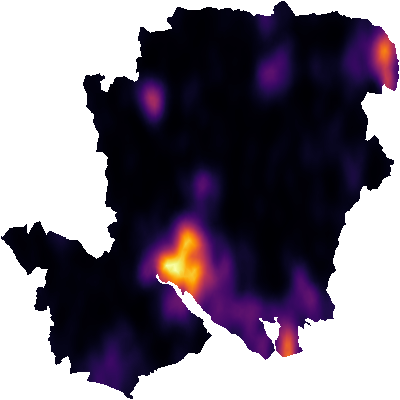

In [15]:
# Interactive plot
m_field = f.mapplot(
    boundary_nodes = boundary_nodes, 
    layer_name     = "log_density",
    cmap_name      = "inferno", 
    zoom_start     = 9,
    border_weight  = 3,
    nx             = 400, 
    ny             = 400
)


m_locs = hampshire["diseases"].mapplot(
    boundary_nodes      = boundary_nodes,
    marker_radius       = 3,
    marker_fill_opacity = 0.5,
    zoom_start          = 9
)

display_folium_map(
    maps        = [m_field, m_locs],
    nrows       = 1,
    ncols       = 2
)

Figure 4: `DE-PDE` density estimate. 

The values of the fitted field consistently reflect the density of the event occurrence locations. Furthermore, the irregular geometry of the spatial domain affects the spread of the disease, leading, for example, to distinct behaviours along the western and eastern shores of the Southampton Water estuary. Overall, the method successfully captures this spatial pattern.


## References

Arnone, E., Ferraccioli, F., Pigolotti, C., & Sangalli, L. M. (2022). A roughness penalty approach to estimate densities over two-dimensional manifolds. Computational Statistics & Data Analysis, 174. https://doi.org/10.1016/j.csda.2022.107527

Begu, B., Panzeri, S., Arnone, E., Carey, M., & Sangalli, L. M. (2024). A nonparametric penalized likelihood approach to density estimation of space-time point patterns. Spatial Statistics. https://doi.org/10.1016/j.spasta.2024.100824

Diggle, P., Knorr-Held, L., Rowlingson, B., Su, T.-L., Hawtin, P., & Bryant, T. N. (2003). On-line monitoring of public health surveillance data. In Monitoring the health of populations (pp. 233–266).

Diggle, P., Rowlingson, B., & Su, T. (2005). Point process methodology for on-line spatio-temporal disease surveillance. Environmetrics, 16(5), 423–434.

Ferraccioli, F., Arnone, E., Finos, L., Ramsay, J. O., & Sangalli, L. M. (2021). Nonparametric density estimation over complicated domains. Journal of the Royal Statistical Society Series B: Statistical Methodology, 83(2), 346–368. https://doi.org/10.1111/rssb.12415

Palummo, A., Clemente, A., Sangalli, E., Arnone, Formaggia, L., & Maria, L. (2025). fdaPDE: Physics-informed statistical learning. url: https://github.com/fdaPDE/fdaPDE-R.

Python Visualization Team. (2024). Folium (Version 0.20.0) [Computer software]. https://github.com/python-visualization/folium

Sangalli, L. M. (2021). Spatial regression with partial differential equation regularisation. International Statistical Review, 89(3), 505–531. https://doi.org/10.1111/insr.12444
